In [1]:
import os
import torch

# Go one level up from current working directory
parent_dir = os.path.abspath(os.path.join(os.getcwd(), ".."))

# Full path to the .pt file in the parent directory
pt_file_path = os.path.join(parent_dir, "images_from_dino.pt")

# Load the file
loaded_list = torch.load(pt_file_path, map_location='cpu')



In [2]:
print(type(loaded_list))


<class 'dict'>


In [3]:
if isinstance(loaded_list, dict):
    print("Keys:", loaded_list.keys())


Keys: dict_keys(['pred_mask', 'gt_mask', 'jac', 'input'])


In [4]:
for k, v in loaded_list.items():
    if isinstance(v, torch.Tensor):
        print(f"{k}: Tensor, shape = {v.shape}")
    elif isinstance(v, list):
        print(f"{k}: List, length = {len(v)}")
        # Optionally inspect first element
        print(f"  type of first element: {type(v[0])}")
        if isinstance(v[0], torch.Tensor):
            print(f"  shape of first element: {v[0].shape}")
    else:
        print(f"{k}: type = {type(v)}")


pred_mask: List, length = 9
  type of first element: <class 'torch.Tensor'>
  shape of first element: torch.Size([64, 1, 512, 512])
gt_mask: List, length = 9
  type of first element: <class 'torch.Tensor'>
  shape of first element: torch.Size([64, 1, 512, 512])
jac: List, length = 2
  type of first element: <class 'float'>
input: List, length = 9
  type of first element: <class 'torch.Tensor'>
  shape of first element: torch.Size([64, 3, 512, 512])


In [6]:
# import torch 
import matplotlib.pyplot as plt

def denormalize(tensor, mean, std):
    """
    Undo normalization of a tensor image.
    
    Args:
        tensor (Tensor): Tensor image of shape [3, H, W]
        mean (list): Mean values used in normalization
        std (list): Std values used in normalization
    
    Returns:
        Tensor: Denormalized image
    """
    mean = torch.tensor(mean).view(-1, 1, 1)
    std = torch.tensor(std).view(-1, 1, 1)
    return tensor * std + mean


# NOte std
# SAT standard deviation is calculated so that 68% of students score within one standard deviation of the mean, 95% of students score within two standard deviations of the mean, and 99+% of students score within three standard deviations of the mean.

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
# loaded_list = torch.load('images_from_dino.pt', map_location='cpu')
preds = loaded_list['pred_mask']
gt = loaded_list['gt_mask']
jac = loaded_list['jac']
input_x = loaded_list['input']

# CHANGE i
print("i range : ", len(preds[0])-1)

i = 8

print("j batch range : ", len(preds)-1)
j = 6


print(f"0 preds acc : {round(jac[0], 2)}, 1 preds acc : {round(jac[1],2)}")

i range :  63
j batch range :  8
0 preds acc : 0.98, 1 preds acc : 0.77


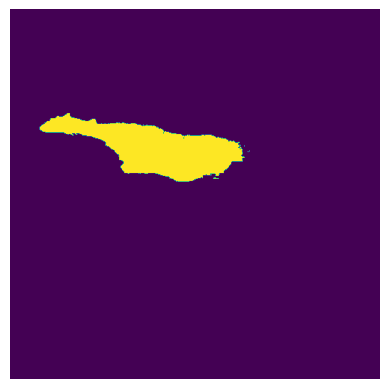

In [3]:
img_np = gt[j][i].permute(1, 2, 0).numpy()

# Display
plt.imshow(img_np)
plt.axis('off')
plt.show()


# 1 single img showed

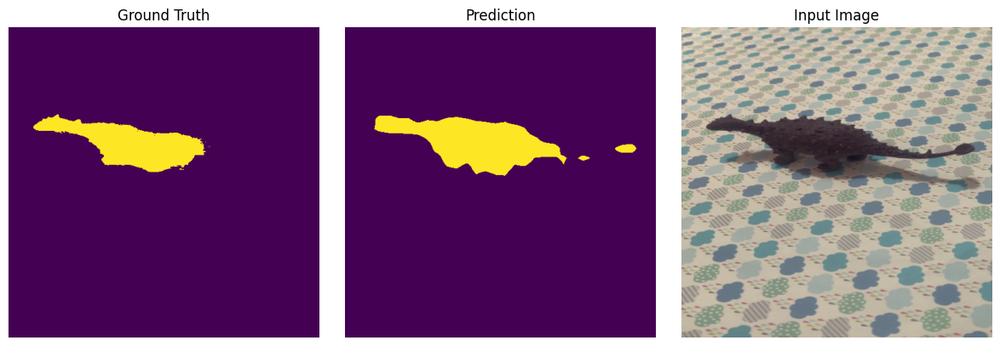

In [16]:

preds_img = preds[j][i].permute(1, 2, 0).numpy()
gt_img = gt[j][i].permute(1, 2, 0).numpy()

denorm_img = denormalize(input_x[j][i], mean, std)
orig_img = denorm_img.clamp(0, 1).permute(1, 2, 0).cpu().numpy()

fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Display each image in its subplot
axes[0].imshow(gt_img)
axes[0].set_title("Ground Truth")
axes[0].axis('off')

axes[1].imshow(preds_img)
axes[1].set_title("Prediction")
axes[1].axis('off')

axes[2].imshow(orig_img)
axes[2].set_title("Input Image")
axes[2].axis('off')

plt.tight_layout()
plt.show()


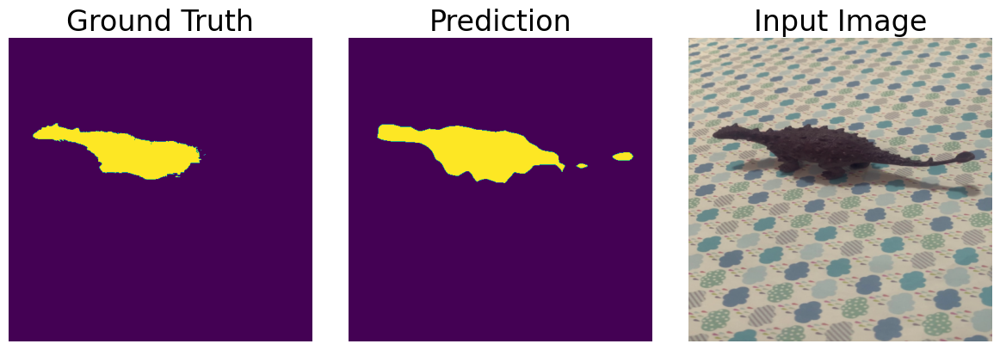

In [7]:
preds_img = preds[j][i].permute(1, 2, 0).numpy()
gt_img = gt[j][i].permute(1, 2, 0).numpy()

denorm_img = denormalize(input_x[j][i], mean, std)
orig_img = denorm_img.clamp(0, 1).permute(1, 2, 0).cpu().numpy()

fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Display each image in its subplot
axes[0].imshow(gt_img)
axes[0].set_title("Ground Truth", fontsize=24)
axes[0].axis('off')

axes[1].imshow(preds_img)
axes[1].set_title("Prediction", fontsize=24)
axes[1].axis('off')

axes[2].imshow(orig_img)
axes[2].set_title("Input Image", fontsize=24)
axes[2].axis('off')

plt.tight_layout()
plt.show()


# overlayed images

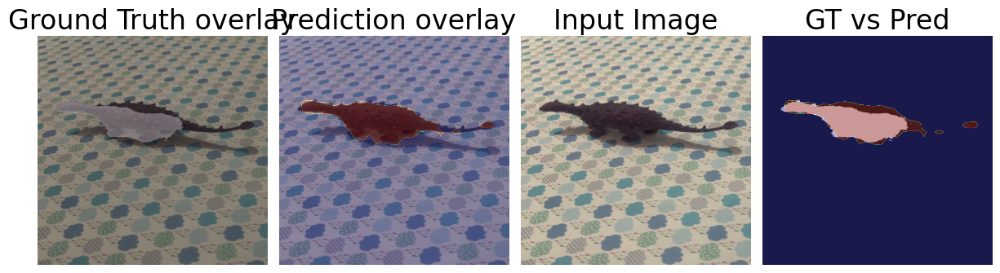

In [10]:
preds_img = preds[j][i].permute(1, 2, 0).numpy()
gt_img = gt[j][i].permute(1, 2, 0).numpy()

denorm_img = denormalize(input_x[j][i], mean, std)
orig_img = denorm_img.clamp(0, 1).permute(1, 2, 0).cpu().numpy()

fig, axes = plt.subplots(1, 4, figsize=(12, 4))

# Display each image in its subplot
axes[0].imshow(gt_img, cmap='gray')
axes[0].imshow(orig_img, alpha=0.7)
axes[0].set_title("Ground Truth overlay", fontsize=24)
axes[0].axis('off')

axes[1].imshow(preds_img, cmap='jet')
axes[1].imshow(orig_img, alpha=0.7)
axes[1].set_title("Prediction overlay", fontsize=24)
axes[1].axis('off')

axes[2].imshow(orig_img)
axes[2].set_title("Input Image", fontsize=24)
axes[2].axis('off')

axes[3].imshow(preds_img, cmap='jet', alpha=0.8)
axes[3].imshow(gt_img, cmap='gray', alpha=0.5)
axes[3].set_title("GT vs Pred", fontsize=24)
axes[3].axis('off')

plt.tight_layout()
# plt.legend(handles=[pred_patch], loc='lower right')
plt.show()


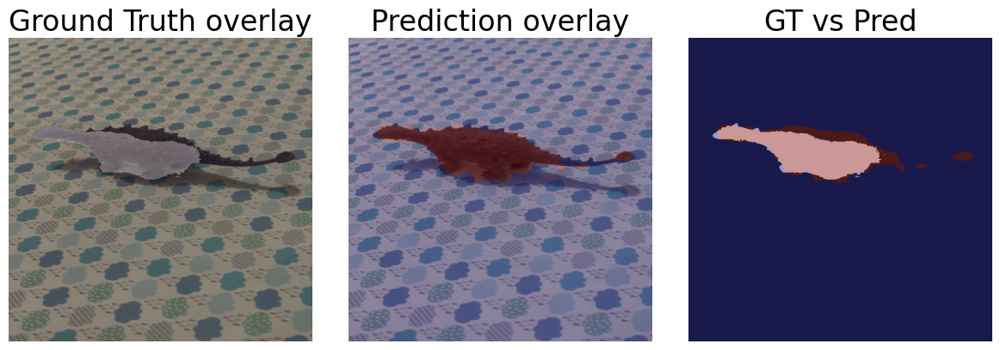

In [6]:
preds_img = preds[j][i].permute(1, 2, 0).numpy()
gt_img = gt[j][i].permute(1, 2, 0).numpy()

denorm_img = denormalize(input_x[j][i], mean, std)
orig_img = denorm_img.clamp(0, 1).permute(1, 2, 0).cpu().numpy()

fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Ground Truth overlay
axes[0].imshow(gt_img, cmap='gray')
axes[0].imshow(orig_img, alpha=0.7)
axes[0].set_title("Ground Truth overlay", fontsize=24)
axes[0].axis('off')

# Prediction overlay
axes[1].imshow(preds_img, cmap='jet')
axes[1].imshow(orig_img, alpha=0.7)
axes[1].set_title("Prediction overlay", fontsize=24)
axes[1].axis('off')

# GT vs Pred
axes[2].imshow(preds_img, cmap='jet', alpha=0.8)
axes[2].imshow(gt_img, cmap='gray', alpha=0.5)
axes[2].set_title("GT vs Pred", fontsize=24)
axes[2].axis('off')

plt.tight_layout()
plt.show()


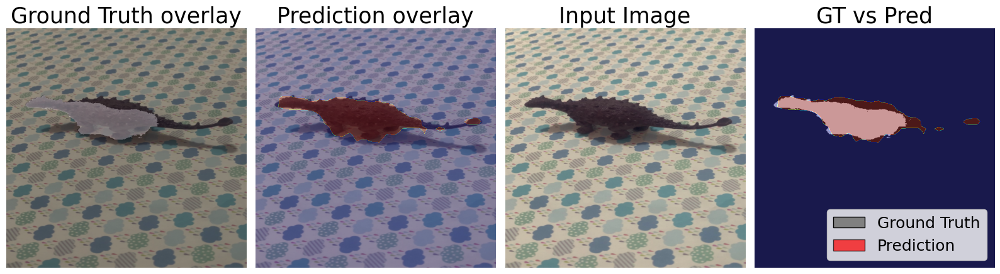

In [20]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# Your image processing code (as before)
preds_img = preds[j][i].permute(1, 2, 0).numpy()
gt_img = gt[j][i].permute(1, 2, 0).numpy()

denorm_img = denormalize(input_x[j][i], mean, std)
orig_img = denorm_img.clamp(0, 1).permute(1, 2, 0).cpu().numpy()

fig, axes = plt.subplots(1, 4, figsize=(16, 5))  # increased size for spacing

# Display each image in its subplot
axes[0].imshow(gt_img, cmap='gray')
axes[0].imshow(orig_img, alpha=0.7)
axes[0].set_title("Ground Truth overlay", fontsize=25)
axes[0].axis('off')

axes[1].imshow(preds_img, cmap='jet')
axes[1].imshow(orig_img, alpha=0.7)
axes[1].set_title("Prediction overlay", fontsize=25)
axes[1].axis('off')

axes[2].imshow(orig_img)
axes[2].set_title("Input Image", fontsize=25)
axes[2].axis('off')

# Then overlay prediction and ground truth
axes[3].imshow(preds_img, cmap='jet', alpha=0.8)
axes[3].imshow(gt_img, cmap='gray', alpha=0.5)
axes[3].set_title("GT vs Pred", fontsize=25)
axes[3].axis('off')

# Add legend to this axis
legend_elements = [
    Patch(facecolor='gray', edgecolor='black', label='Ground Truth'),
    Patch(facecolor='red', edgecolor='black', label='Prediction', alpha=0.7)
]
axes[3].legend(handles=legend_elements, loc='lower right', fontsize=18, frameon=True)


plt.tight_layout()
plt.show()

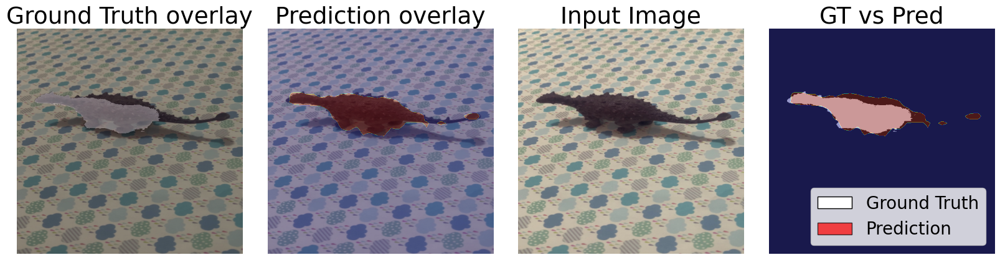

In [37]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import numpy as np
import torch

# Get the data (your original tensor setup)
preds_img = preds[j][i].permute(1, 2, 0).numpy()
gt_img = gt[j][i].permute(1, 2, 0).numpy()

denorm_img = denormalize(input_x[j][i], mean, std)
orig_img = denorm_img.clamp(0, 1).permute(1, 2, 0).cpu().numpy()

# Create subplots
fig, axes = plt.subplots(1, 4, figsize=(16, 5))

# --- Subplot 0: Ground Truth Overlay ---
axes[0].imshow(gt_img, cmap='gray')
axes[0].imshow(orig_img, alpha=0.7)
axes[0].set_title("Ground Truth overlay", fontsize=27)
axes[0].axis('off')

# --- Subplot 1: Prediction Overlay ---
axes[1].imshow(preds_img, cmap='jet')
axes[1].imshow(orig_img, alpha=0.7)
axes[1].set_title("Prediction overlay", fontsize=27)
axes[1].axis('off')

# --- Subplot 2: Input Image ---
axes[2].imshow(orig_img)
axes[2].set_title("Input Image", fontsize=27)
axes[2].axis('off')

# --- Subplot 3: GT vs Pred with yellow background ---
axes[3].set_facecolor((1.0, 1.0, 0.0))  # Set yellow background
axes[3].imshow(preds_img, cmap='jet', alpha=0.8)
axes[3].imshow(gt_img, cmap='gray', alpha=0.5)
axes[3].set_title("GT vs Pred", fontsize=27)
axes[3].axis('off')

# --- Legend in bottom right of GT vs Pred ---
legend_elements = [
    Patch(facecolor='white', edgecolor='black', label='Ground Truth'),
    Patch(facecolor='red', edgecolor='black', label='Prediction', alpha=0.7)
]
axes[3].legend(handles=legend_elements, loc='lower right', fontsize=20, frameon=True)

# --- Final layout ---
plt.tight_layout()
plt.show()

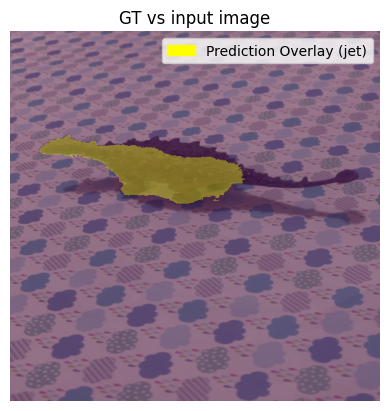

In [18]:
import matplotlib.pyplot as plt
import torch
import matplotlib.patches as mpatches

# Example image tensors [C, H, W]
# i = 2
img1 = gt[j][i]
img2 = preds[j][i]

# Convert to NumPy and permute to [H, W, C]
img1_np = img1.permute(1, 2, 0).numpy()
img2_np = img2.permute(1, 2, 0).numpy()

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

denorm_img = denormalize(input_x[j][i], mean, std)

# Clamp to [0,1] and convert to numpy
img3 = denorm_img.clamp(0, 1).permute(1, 2, 0).cpu().numpy()

# gt_patch = mpatches.Patch(color='gray', label='Ground Truth')
pred_patch = mpatches.Patch(color='yellow', label='Prediction Overlay (jet)')

# Average blend
plt.imshow(img1_np, alpha=1)
# plt.imshow(img2_np,  cmap='jet',  alpha=0.5)  # Half-transparent overlay
plt.imshow(img3, alpha=0.6)
plt.title('GT vs input image')
plt.axis('off')
plt.legend(handles=[pred_patch], loc='upper right')
plt.show()


# plt.imshow(blended)
# plt.axis('off')
# plt.show()


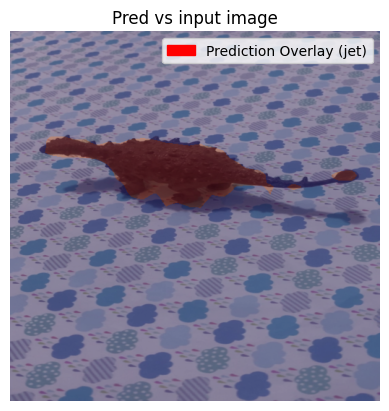

In [19]:
import matplotlib.pyplot as plt
import torch
import matplotlib.patches as mpatches

# Example image tensors [C, H, W]
img1 = gt[j][i]
img2 = preds[j][i]

# Convert to NumPy and permute to [H, W, C]
img1_np = img1.permute(1, 2, 0).numpy()
img2_np = img2.permute(1, 2, 0).numpy()

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

denorm_img = denormalize(input_x[j][i], mean, std)

# Clamp to [0,1] and convert to numpy
img3 = denorm_img.clamp(0, 1).permute(1, 2, 0).cpu().numpy()

# gt_patch = mpatches.Patch(color='gray', label='Ground Truth')
pred_patch = mpatches.Patch(color='red', label='Prediction Overlay (jet)')

# Average blend
# plt.imshow(img1_np, alpha=1)
plt.imshow(img2_np,  cmap='jet',  alpha=1)  # Half-transparent overlay
plt.imshow(img3, alpha=0.7)
plt.title('Pred vs input image')
plt.axis('off')
plt.legend(handles=[pred_patch], loc='upper right')
plt.show()


# plt.imshow(blended)
# plt.axis('off')
# plt.show()


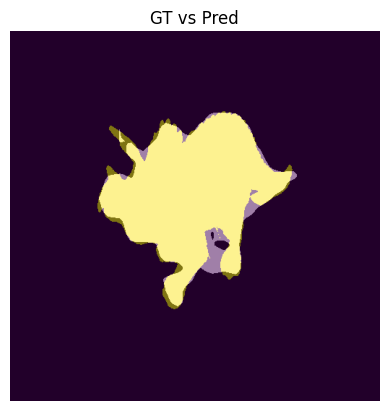

In [20]:
import matplotlib.pyplot as plt
import torch

# Example image tensors [C, H, W]
img1 = gt[0][0]
img2 = preds[0][0]
img3 = torch.rand(3, 128, 128)

# Convert to NumPy and permute to [H, W, C]
img1_np = img1.permute(1, 2, 0).numpy()
img2_np = img2.permute(1, 2, 0).numpy()
img3_np = img3.permute(1, 2, 0).numpy()

# Average blend
plt.imshow(img1_np, alpha=1)
plt.imshow(img2_np,  cmap='gray',  alpha=0.5)  # Half-transparent overlay
# plt.imshow(img_np_norm, alpha=0.7)
plt.title('GT vs Pred')
plt.axis('off')
plt.show()

#gt_vs_pred_triceratops.png


# plt.imshow(blended)
# plt.axis('off')
# plt.show()


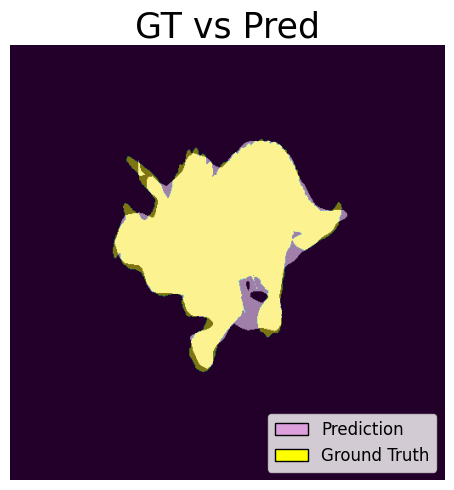

In [34]:
import matplotlib.pyplot as plt
import torch
from matplotlib.patches import Patch
import numpy as np

# Example image tensors [C, H, W]
img1 = gt[0][0]
img2 = preds[0][0]
img3 = torch.rand(3, 128, 128)

# Convert to NumPy and permute to [H, W, C]
img1_np = img1.permute(1, 2, 0).numpy()
img2_np = img2.permute(1, 2, 0).numpy()
img3_np = img3.permute(1, 2, 0).numpy()

# Create figure and axes
fig, ax = plt.subplots(figsize=(5, 5))

# Plot GT and prediction overlay
ax.imshow(img1_np, alpha=1)
ax.imshow(img2_np, cmap='gray', alpha=0.5)
ax.set_title('GT vs Pred', fontsize=25)
ax.axis('off')

# Define legend handles
legend_elements = [
    Patch(facecolor='plum', edgecolor='black', label='Prediction'),
    Patch(facecolor='yellow', edgecolor='black', label='Ground Truth')
]

# Add legend to bottom right of image
ax.legend(handles=legend_elements, loc='lower right', fontsize=12, frameon=True)

plt.tight_layout()
plt.show()


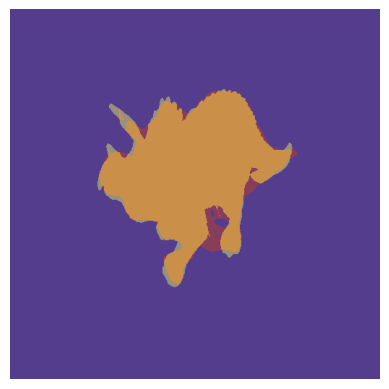

In [21]:
plt.imshow(img1_np*255, alpha= 0.6)
plt.imshow(img2_np*255, cmap='jet', alpha=0.4)  # jet, viridis, etc.
plt.axis("off")
plt.show()


In [22]:
import os

path = '/home/scur0542/open-hummingbird-eval/datasets/split_angles_mvimagenet/70'

print('0 img : ', len(os.listdir(path+'/0/img')))
print('0 mask : ', len(os.listdir(path+'/0/mask')))
print()
print('15 img : ', len(os.listdir(path+'/15/img')))
print('15 mask : ', len(os.listdir(path+'/15/mask')))
print()
print('30 img : ', len(os.listdir(path+'/30/img')))
print('30 mask : ', len(os.listdir(path+'/30/mask')))


print('0 img : ', len(os.listdir(path+'/0/img')))
print('0 mask : ', len(os.listdir(path+'/0/mask')))


print('0 img : ', len(os.listdir(path+'/0/img')))
print('0 mask : ', len(os.listdir(path+'/0/mask')))


print('0 img : ', len(os.listdir(path+'/0/img')))
print('0 mask : ', len(os.listdir(path+'/0/mask')))



0 img :  627
0 mask :  627

15 img :  627
15 mask :  627

30 img :  627
30 mask :  627
0 img :  627
0 mask :  627
0 img :  627
0 mask :  627
0 img :  627
0 mask :  627


In [23]:
'2201453f_011.jpg' in os.listdir(path+'/0/img')

True

In [24]:
'2201453f_011.jpg.png' in os.listdir(path+'/0/img')

False

In [25]:
'011.jpg' in os.listdir('/home/scur0542/open-hummingbird-eval/datasets/mvimgnet/images/70/2201453f/images')


True

In [26]:
'022.jpg.png' in os.listdir('/home/scur0542/open-hummingbird-eval/datasets/mvimgnet/mask/70/2201453f')


True

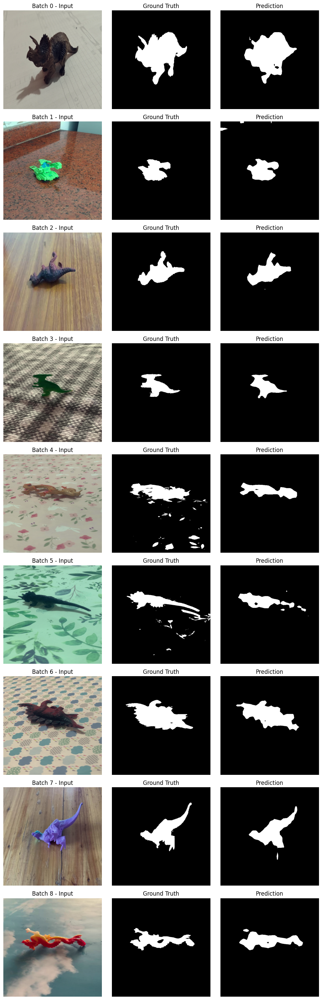

In [11]:
import matplotlib.pyplot as plt

sample_idx = 0  # index within each batch

number_of_batches = 9
fig, axs = plt.subplots(number_of_batches, 3, figsize=(10, 30))  # 9 rows, 3 columns

for batch_idx in range(number_of_batches):
    # Denormalize input image
    img = input_x[batch_idx][sample_idx]
    img = denormalize(img, mean, std).permute(1, 2, 0).numpy()

    # Ground truth and prediction (convert 1x512x512 → 512x512)
    gt_img = gt[batch_idx][sample_idx][0].numpy()
    pred_img = preds[batch_idx][sample_idx][0].numpy()

    # Plot input image
    axs[batch_idx, 0].imshow(img)
    axs[batch_idx, 0].set_title(f"Batch {batch_idx} - Input")
    axs[batch_idx, 0].axis('off')

    # Plot ground truth
    axs[batch_idx, 1].imshow(gt_img, cmap='gray')
    axs[batch_idx, 1].set_title("Ground Truth")
    axs[batch_idx, 1].axis('off')

    # Plot prediction
    axs[batch_idx, 2].imshow(pred_img, cmap='gray')
    axs[batch_idx, 2].set_title("Prediction")
    axs[batch_idx, 2].axis('off')

plt.tight_layout()
plt.show()


In [12]:
import matplotlib.pyplot as plt
import torch

# Full path to the .pt file in the parent directory
pt_file_path = os.path.join(parent_dir, "images_from_dino.pt")

# Load the file
loaded_list = torch.load(pt_file_path, map_location='cpu')

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
# loaded_list = torch.load('images_from_dino.pt', map_location='cpu')
preds = loaded_list['pred_mask']
gt = loaded_list['gt_mask']
# jac = loaded_list['jac']
input_x = loaded_list['input']


def plot_sample_from_all_batches(sample_idx, input_x=input_x, gt=gt, preds=preds, mean= [0.485, 0.456, 0.406], std= [0.229, 0.224, 0.225]):
    """
    Plot a given sample index from all batches.
    
    Args:
        sample_idx (int): Index of the sample within each batch (0 to 63).
        input_x (list of Tensors): List of input image batches.
        gt (list of Tensors): List of ground truth mask batches.
        preds (list of Tensors): List of predicted mask batches.
        mean (list): Normalization mean values.
        std (list): Normalization std values.
    """
    
    def denormalize(tensor, mean, std):
        mean = torch.tensor(mean).view(-1, 1, 1)
        std = torch.tensor(std).view(-1, 1, 1)
        return tensor * std + mean

    number_of_batches = len(input_x)
    fig, axs = plt.subplots(number_of_batches, 3, figsize=(10, 3 * number_of_batches))

    for batch_idx in range(number_of_batches):
        # Denormalize input image
        img = denormalize(input_x[batch_idx][sample_idx], mean, std).permute(1, 2, 0).numpy()

        # Ground truth and prediction
        gt_img = gt[batch_idx][sample_idx][0].numpy()
        pred_img = preds[batch_idx][sample_idx][0].numpy()

        # Plot input image
        axs[batch_idx, 0].imshow(img)
        axs[batch_idx, 0].set_title(f"Batch {batch_idx} - Input")
        axs[batch_idx, 0].axis('off')

        # Plot ground truth
        axs[batch_idx, 1].imshow(gt_img, cmap='gray')
        axs[batch_idx, 1].set_title("Ground Truth")
        axs[batch_idx, 1].axis('off')

        # Plot prediction
        axs[batch_idx, 2].imshow(pred_img, cmap='gray')
        axs[batch_idx, 2].set_title("Prediction")
        axs[batch_idx, 2].axis('off')

    plt.tight_layout()
    plt.show()


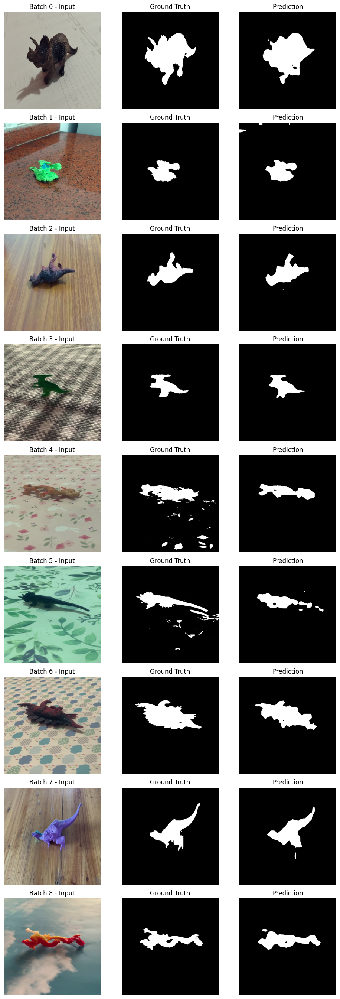

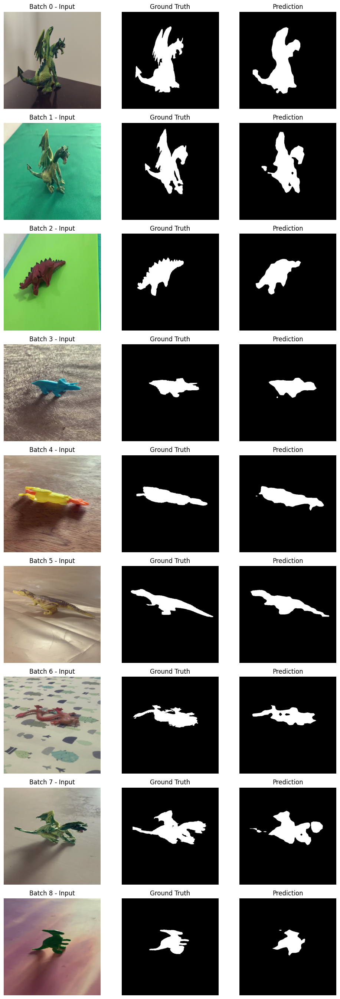

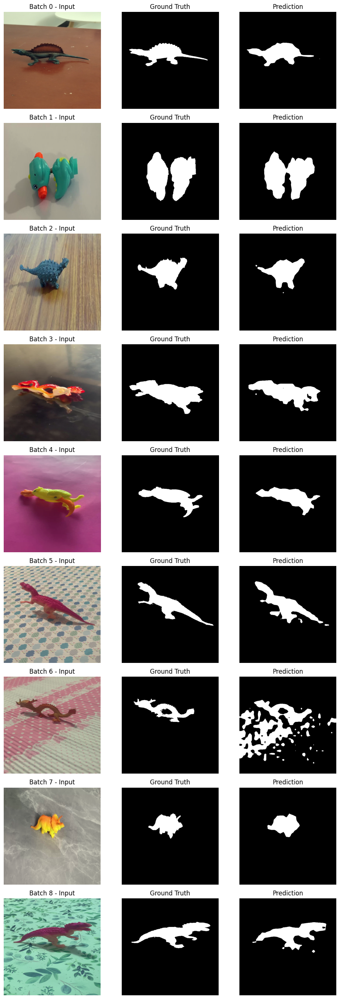

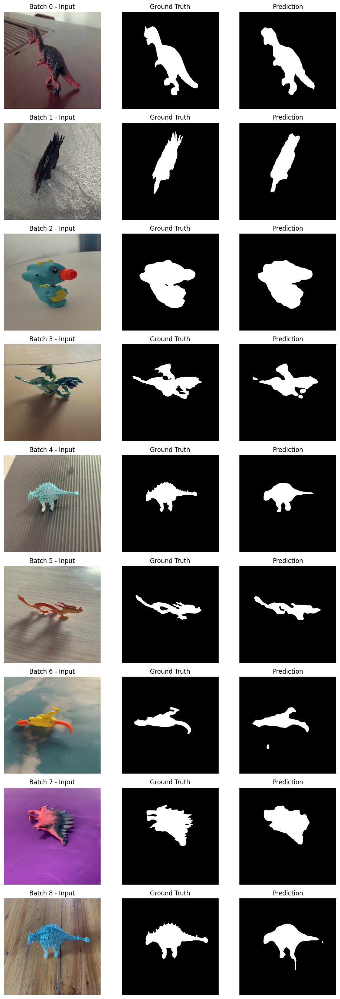

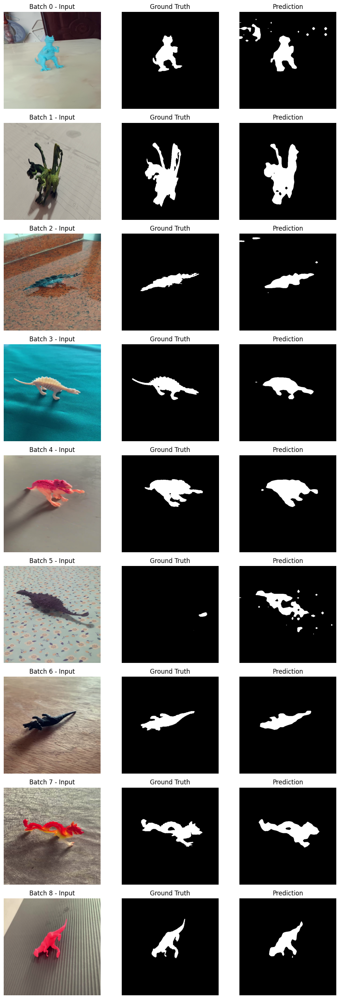

In [14]:
for i in range(5):
    plot_sample_from_all_batches(i)